In [3]:
#importing the libarries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import graphviz
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [4]:
#load dataset in csv to pandas dataframe
Expresso_churn_dataset = pd.read_csv('/content/Expresso_churn_dataset.csv')

In [5]:
Expresso_churn_dataset.head()

,user_id,REGION,TENURE,MONTANT,FREQUENCE_RECH,REVENUE,ARPU_SEGMENT,FREQUENCE,DATA_VOLUME,ON_NET,ORANGE,TIGO,ZONE1,ZONE2,MRG,REGULARITY,TOP_PACK,FREQ_TOP_PACK,CHURN
0,00000bfd7d50f01092811bc0c8d7b0d6fe7c3596,FATICK,K > 24 month,4250.0,15.0,4251.0,1417.0,17.0,4.0,388.0,46.0,1.0,1.0,2.0,NO,54.0,On net 200F=Unlimited _call24H,8.0,0.0
1,00000cb4a5d760de88fecb38e2f71b7bec52e834,NaN,I 18-21 month,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO,4.0,NaN,NaN,1.0
2,00001654a9d9f96303d9969d0a4a851714a4bb57,NaN,K > 24 month,3600.0,2.0,1020.0,340.0,2.0,NaN,90.0,46.0,7.0,NaN,NaN,NO,17.0,On-net 1000F=10MilF;10d,1.0,0.0
3,00001dd6fa45f7ba044bd5d84937be464ce78ac2,DAKAR,K > 24 month,13500.0,15.0,13502.0,4501.0,18.0,43804.0,41.0,102.0,2.0,NaN,NaN,NO,62.0,"Data:1000F=5GB,7d",11.0,0.0
4,000028d9e13a595abe061f9b58f3d76ab907850f,DAKAR,K > 24 month,1000.0,1.0,985.0,328.0,1.0,NaN,39.0,24.0,NaN,NaN,NaN,NO,11.0,Mixt 250F=Unlimited_call24H,2.0,0.0


In [6]:
Expresso_churn_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17415 entries, 0 to 17414
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   user_id         17415 non-null  object 
 1   REGION          10645 non-null  object 
 2   TENURE          17414 non-null  object 
 3   MONTANT         11348 non-null  float64
 4   FREQUENCE_RECH  11348 non-null  float64
 5   REVENUE         11581 non-null  float64
 6   ARPU_SEGMENT    11581 non-null  float64
 7   FREQUENCE       11581 non-null  float64
 8   DATA_VOLUME     8937 non-null   float64
 9   ON_NET          11140 non-null  float64
 10  ORANGE          10159 non-null  float64
 11  TIGO            6966 non-null   float64
 12  ZONE1           1351 non-null   float64
 13  ZONE2           1101 non-null   float64
 14  MRG             17414 non-null  object 
 15  REGULARITY      17414 non-null  float64
 16  TOP_PACK        10164 non-null  object 
 17  FREQ_TOP_PACK   10164 non-null 

In [7]:
Expresso_churn_dataset.describe()

,MONTANT,FREQUENCE_RECH,REVENUE,ARPU_SEGMENT,FREQUENCE,DATA_VOLUME,ON_NET,ORANGE,TIGO,ZONE1,ZONE2,REGULARITY,FREQ_TOP_PACK,CHURN
count,11348.000000,11348.000000,11581.000000,11581.000000,11581.000000,8937.000000,11140.000000,10159.000000,6966.000000,1351.000000,1101.000000,17414.000000,10164.000000,17414.000000
mean,5497.576665,11.456204,5470.829462,1823.614627,13.835420,3652.901533,274.400449,96.013781,22.452053,7.682457,7.839237,28.175032,9.193526,0.187148
std,6996.244929,13.231042,7132.540751,2377.507138,14.574407,18530.918291,813.713667,204.108466,57.559849,34.928825,37.130783,22.299943,12.002272,0.390042
min,50.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,1000.000000,2.000000,1000.000000,333.000000,3.000000,0.000000,5.000000,7.000000,2.000000,0.000000,0.000000,6.000000,2.000000,0.000000
50%,3000.000000,6.000000,2995.000000,998.000000,9.000000,294.000000,26.000000,29.000000,6.000000,1.000000,1.000000,24.000000,5.000000,0.000000
75%,7400.000000,15.000000,7399.000000,2466.000000,19.000000,2955.000000,152.000000,97.000000,21.000000,3.000000,5.000000,51.000000,12.000000,0.000000
max,91500.000000,106.000000,147739.000000,49246.000000,89.000000,926547.000000,11987.000000,4196.000000,1476.000000,820.000000,932.000000,62.000000,151.000000,1.000000


In [8]:
Expresso_churn_dataset.duplicated()

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
30       False
31       False
32       False
33       False
34       False
35       False
36       False
37       False
38       False
39       False
40       False
41       False
42       False
43       False
44       False
45       False
46       False
47       False
48       False
49       False
50       False
51       False
52       False
53       False
54       False
55       False
56       False
57       False
58       False
59       False
60       False
61       False
62       False
63       False
64       False
65       False
66       F

In [9]:
!pip install ydata_profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 25.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 85.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=8b78c1e55e86614b69c403b236b5f065f0193aad98d869d519070d87d2c89e9f
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [10]:
from ydata_profiling import ProfileReport
profile= ProfileReport(Expresso_churn_dataset, title="Expresso Report")
#displaying the report
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
Expresso_churn_dataset.isna().sum() #check for missing values

user_id               0
REGION             6770
TENURE                1
MONTANT            6067
FREQUENCE_RECH     6067
REVENUE            5834
ARPU_SEGMENT       5834
FREQUENCE          5834
DATA_VOLUME        8478
ON_NET             6275
ORANGE             7256
TIGO              10449
ZONE1             16064
ZONE2             16314
MRG                   1
REGULARITY            1
TOP_PACK           7251
FREQ_TOP_PACK      7251
CHURN                 1
dtype: int64

In [12]:
#dealing with the missing values
Expresso_churn_dataset.drop(columns=['ZONE1', 'ZONE2'], inplace = True, axis =1)

In [14]:
# Impute missing values in numerical features using SimpleImputer with 'mean' strategy
num_cols = Expresso_churn_dataset.select_dtypes(include=['int64', 'float64']).columns
imputer = SimpleImputer(strategy='most_frequent')
X_num = Expresso_churn_dataset[num_cols]
X_num_imputed = imputer.fit_transform(X_num)
X_num_imputed = pd.DataFrame(X_num_imputed, columns=num_cols)

In [15]:
# Impute missing values in categorical features using SimpleImputer with 'most_frequent' strategy
cat_cols = Expresso_churn_dataset.select_dtypes(include=['object']).columns
cat_imputer = SimpleImputer(strategy='most_frequent')
X_cat = Expresso_churn_dataset[cat_cols]
X_cat_imputed = cat_imputer.fit_transform(X_cat)
X_cat_imputed = pd.DataFrame(X_cat_imputed, columns=cat_cols)

In [16]:
# Update the original DataFrame with the imputed data
Expresso_churn_dataset[num_cols] = X_num_imputed
Expresso_churn_dataset[cat_cols] = X_cat_imputed

In [17]:
Expresso_churn_dataset.head()

,user_id,REGION,TENURE,MONTANT,FREQUENCE_RECH,REVENUE,ARPU_SEGMENT,FREQUENCE,DATA_VOLUME,ON_NET,ORANGE,TIGO,MRG,REGULARITY,TOP_PACK,FREQ_TOP_PACK,CHURN
0,00000bfd7d50f01092811bc0c8d7b0d6fe7c3596,FATICK,K > 24 month,4250.0,15.0,4251.0,1417.0,17.0,4.0,388.0,46.0,1.0,NO,54.0,On net 200F=Unlimited _call24H,8.0,0.0
1,00000cb4a5d760de88fecb38e2f71b7bec52e834,DAKAR,I 18-21 month,500.0,1.0,500.0,167.0,1.0,0.0,0.0,1.0,1.0,NO,4.0,All-net 500F=2000F;5d,1.0,1.0
2,00001654a9d9f96303d9969d0a4a851714a4bb57,DAKAR,K > 24 month,3600.0,2.0,1020.0,340.0,2.0,0.0,90.0,46.0,7.0,NO,17.0,On-net 1000F=10MilF;10d,1.0,0.0
3,00001dd6fa45f7ba044bd5d84937be464ce78ac2,DAKAR,K > 24 month,13500.0,15.0,13502.0,4501.0,18.0,43804.0,41.0,102.0,2.0,NO,62.0,"Data:1000F=5GB,7d",11.0,0.0
4,000028d9e13a595abe061f9b58f3d76ab907850f,DAKAR,K > 24 month,1000.0,1.0,985.0,328.0,1.0,0.0,39.0,24.0,1.0,NO,11.0,Mixt 250F=Unlimited_call24H,2.0,0.0


In [18]:
Expresso_churn_dataset.shape

(17415, 17)

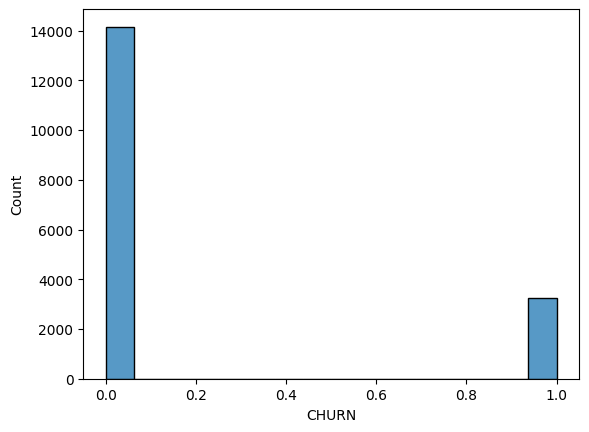

In [19]:
sns.histplot(Expresso_churn_dataset["CHURN"])
plt.show()

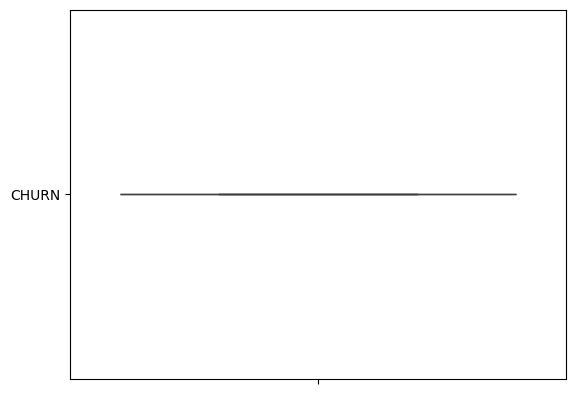

In [20]:
sns.boxplot(["CHURN"])
plt.show()

In [21]:
#Encode categorical features
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()

In [22]:
coloumn= Expresso_churn_dataset.select_dtypes(include=['object']).columns
coloumn
 #[dataset.select_dtypes(exclude=['object']).isnull().any()]
# Categorical Columns with missing values

Index(['user_id', 'REGION', 'TENURE', 'MRG', 'TOP_PACK'], dtype='object')

In [23]:
#Converting your categorical data to numerical data
for col in coloumn:
  Expresso_churn_dataset[col]=label.fit_transform(Expresso_churn_dataset[col])


In [24]:
Expresso_churn_dataset.head()

,user_id,REGION,TENURE,MONTANT,FREQUENCE_RECH,REVENUE,ARPU_SEGMENT,FREQUENCE,DATA_VOLUME,ON_NET,ORANGE,TIGO,MRG,REGULARITY,TOP_PACK,FREQ_TOP_PACK,CHURN
0,0,2,7,4250.0,15.0,4251.0,1417.0,17.0,4.0,388.0,46.0,1.0,0,54.0,55,8.0,0.0
1,1,0,5,500.0,1.0,500.0,167.0,1.0,0.0,0.0,1.0,1.0,0,4.0,9,1.0,1.0
2,2,0,7,3600.0,2.0,1020.0,340.0,2.0,0.0,90.0,46.0,7.0,0,17.0,56,1.0,0.0
3,3,0,7,13500.0,15.0,13502.0,4501.0,18.0,43804.0,41.0,102.0,2.0,0,62.0,17,11.0,0.0
4,4,0,7,1000.0,1.0,985.0,328.0,1.0,0.0,39.0,24.0,1.0,0,11.0,52,2.0,0.0


In [25]:
#Select your target variable and the features
# Divide dataframe into X- input features, y- target features
X = Expresso_churn_dataset.drop(columns=['ORANGE', 'user_id'], axis=1).values #drop the columns that are not needed
y = Expresso_churn_dataset['CHURN'].values

In [26]:
#selecting  the target variable
columns = ['REGION','TENURE','MONTANT',
            'FREQUENCE_RECH','REVENUE',
            'ARPU_SEGMENT','FREQUENCE','DATA_VOLUME',
            'ON_NET','MRG','REGULARITY','TOP_PACK','FREQ_TOP_PACK']

x = Expresso_churn_dataset[columns].values
y = Expresso_churn_dataset['CHURN'].values

In [27]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()

In [28]:
#Split your dataset to training and test sets
# Split data into 80% Training & 20% Testing
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=30)

In [29]:
# Standardize data to avoid high variations in the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [30]:
model.fit(x_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [31]:
y_pred = model.predict(x_test)


In [32]:
train_pred = model.predict(x_train) # Predict Training data with model
# Check for model performance on Training data
print("MSE", mean_squared_error(y_train,train_pred))
print("R squared", metrics.r2_score(y_train,train_pred))

MSE 0.1473585989089865
R squared 0.03151038675661466


In [33]:
predicted=model.predict(x_test) # Predict test data with the model

In [35]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print('Confusion Matrix:\n', conf_matrix)
print('Classification Report:\n', class_report)

Accuracy: 0.8535745047372955
Confusion Matrix:
 [[2755   77]
 [ 433  218]]
Classification Report:
               precision    recall  f1-score   support

         0.0       0.86      0.97      0.92      2832
         1.0       0.74      0.33      0.46       651

    accuracy                           0.85      3483
   macro avg       0.80      0.65      0.69      3483
weighted avg       0.84      0.85      0.83      3483



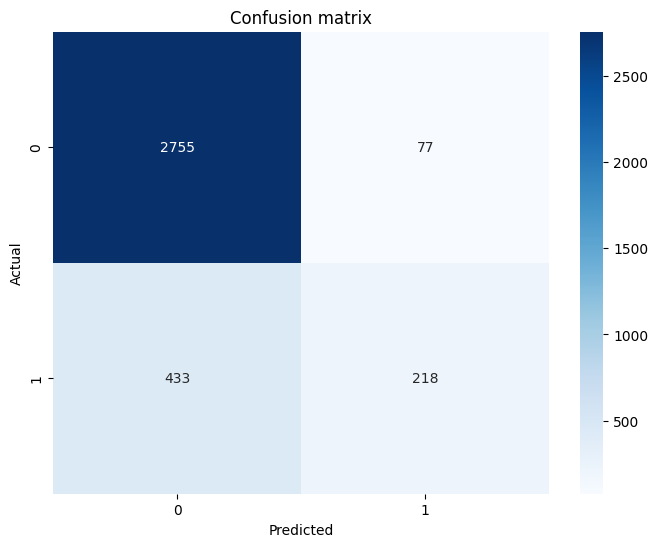

In [36]:
#sing confusion matrix to visulaize and summarize the performance
conf_matrix= confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
plt.title('Confusion matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()